In [1]:
import spotiphy
import numpy as np
import pandas as pd
import matplotlib as mpl
import scanpy as sc
import squidpy as sq
import importlib as imp

In [29]:
sample = '1'
results_folder = 'Results/Breast cancer/' + sample + '/'
adata_sc = sc.read_h5ad("F:/Ziqian Zheng/Spotiphy_data/BreastCancerData/bcsc_down.h5ad")
adata_st = sc.read_h5ad("F:/Ziqian Zheng/Spotiphy_data/BreastCancerData/visium_spatial_sample_v0"+sample+".h5ad")
key_type = 'broad_cell_type'
type_list = sorted(list(adata_sc.obs[key_type].unique()))
print(f'There are {len(type_list)} cell types: {type_list}')

X = adata_st.obsm['X_spatial']
X[:, 1] = -X[:, 1]
adata_st.obsm['X_spatial'] = X

adata_st_own = sc.read_h5ad("F:/Ziqian Zheng/Spotiphy_data/Simulated ST/ST_Simulated_221_1.h5ad")
adata_st.uns['spatial'] = adata_st_own.uns['spatial']
del adata_st_own

There are 10 cell types: ['basal', 'bcells', 'fibroblasts', 'lumhr', 'lumsec', 'lymphatic', 'myeloid', 'pericytes', 'tcells', 'vascular']


In [39]:
adata_sc_orig = adata_sc.copy()
adata_st_orig = adata_st.copy()

In [40]:
adata_sc.obs.value_counts(key_type)

broad_cell_type
tcells         43896
myeloid        22877
vascular       15000
bcells         12510
pericytes      10000
lumsec          6401
basal           5000
fibroblasts     5000
lymphatic       5000
lumhr           3599
Name: count, dtype: int64

### Deconvolution

In [41]:
adata_sc, adata_st = spotiphy.sc_reference.initialization(adata_sc, adata_st, verbose=1)

Convert expression matrix to array: 5.07s
Normalization: 44.27s
Filtering: 50.66s
Find common genes: 0.17s


In [42]:
marker_gene_dict = spotiphy.sc_reference.marker_selection_1(adata_sc, key_type=key_type, return_dict=True, n_select=50,
                                                            threshold_p=0.1, threshold_fold=1.5, q=0.15)
marker_gene = []
marker_gene_label = []
for type_ in type_list:
    marker_gene.extend(marker_gene_dict[type_])
    marker_gene_label.extend([type_]*len(marker_gene_dict[type_]))
marker_gene_df = pd.DataFrame({'gene':marker_gene, 'label':marker_gene_label})
marker_gene_df.to_csv(results_folder+'marker_gene.csv')
adata_sc = adata_sc[:, marker_gene]
adata_st = adata_st[:, marker_gene]

10it [00:00, 51.24it/s]


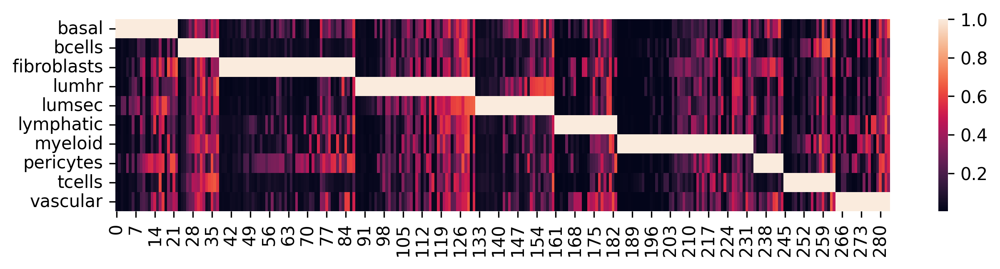

In [43]:
sc_ref = spotiphy.construct_sc_ref(adata_sc, key_type=key_type)
spotiphy.sc_reference.plot_heatmap(adata_sc, key_type, save=True, out_dir=results_folder)

100%|██████████| 7000/7000 [03:41<00:00, 31.57it/s]


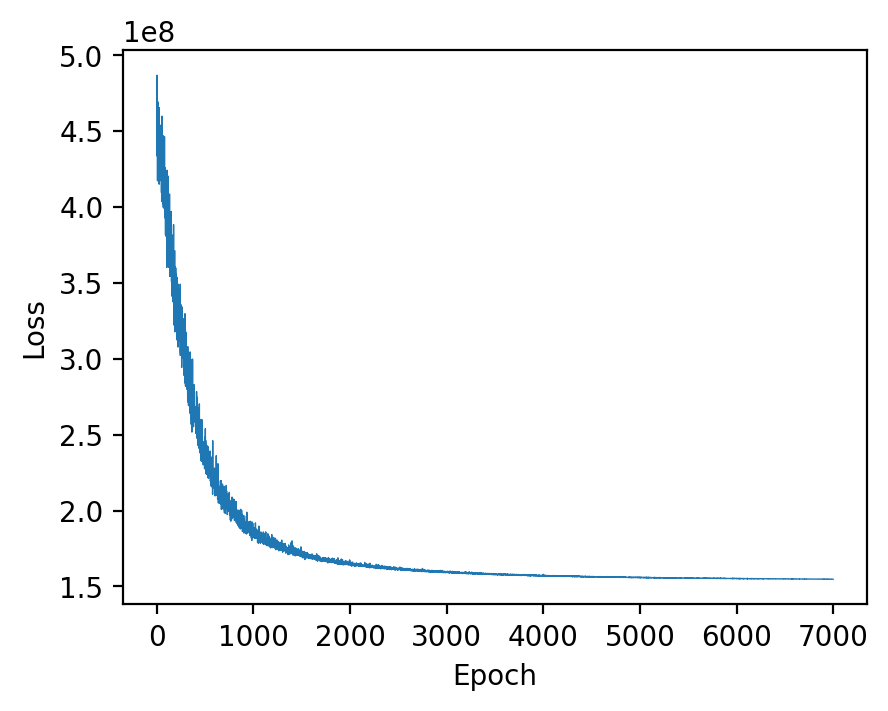

2037772055.py (7): Trying to modify attribute `.obs` of view, initializing view as actual.


In [44]:
X = np.array(adata_st.X)
pyro_params = spotiphy.deconvolution.deconvolute(X, sc_ref, n_epoch=7000, plot=True, batch_prior=2)
sigma = pyro_params['sigma'].cpu().detach().numpy()
mean_exp = np.array([np.mean(np.sum(adata_sc.X[adata_sc.obs[key_type]==type_list[i]], axis=1)) for i in range(len(type_list))])
cell_proportion = sigma/mean_exp
cell_proportion = cell_proportion/np.sum(cell_proportion, axis=1)[:, np.newaxis]
adata_st.obs[type_list] = cell_proportion
np.save(results_folder+'proportion.npy', cell_proportion)

In [30]:
cell_proportion = np.load(results_folder+'proportion.npy')
adata_st.obs[type_list] = cell_proportion
type_list_order = type_list

In [46]:
vmax = np.quantile(adata_st.obs[type_list_order].values, 0.98, axis=0)
vmax[vmax<0.05] = 0.05
with mpl.rc_context({'figure.figsize': [4, 4.5], 'figure.dpi': 600}):
    ax = sc.pl.spatial(adata_st, cmap='magma', color=type_list_order, img_key=None, vmin=0, vmax=list(vmax), ncols=4,
                       size=0.38, show=False, )
    ax[0].get_figure().savefig(results_folder+'spotiphy.jpg', bbox_inches='tight')

In [31]:
%matplotlib agg
%matplotlib agg
vmax = np.quantile(adata_st.obs[type_list_order].values, 0.98, axis=0)
vmax[vmax<0.05] = 0.05
with mpl.rc_context({'figure.figsize': [5, 5], 'figure.dpi': 800}):
    for i, cell_type in enumerate(type_list):
        ax = sc.pl.spatial(adata_st, cmap='magma', color=cell_type, img_key=None, vmin=0, vmax=vmax[i], size=0.38, show=False)
        cell_type = "".join(x for x in cell_type if x.isalnum())
        ax[0].get_figure().savefig(results_folder+'individual/'+cell_type+'.jpg')

### Decomposition

In [47]:
cell_proportion = np.load(results_folder+'proportion.npy')
n_cell = np.repeat(10, len(adata_st))
adata_st = adata_st_orig.copy()
adata_sc = adata_sc_orig.copy()
adata_st_decomposed = spotiphy.deconvolution.decomposition(adata_st, adata_sc, key_type, cell_proportion, save=True,
                                                           out_dir=results_folder, threshold=0.1, verbose=1, filtering_gene=True,  
                                                           spot_location=adata_st.obsm['X_spatial'], n_cell=n_cell, 
                                                           filename='ST_decomposition_BC'+sample+'.h5ad')

Prepared proportion data. Time use 0.11
Initialized scRNA and ST data. Time use 98.47


10it [00:10,  1.09s/it]


Processed scRNA and ST data. Time use 81.58
Decomposition complete. Time use 10.35
Constructed ST decomposition data file. Time use 7.59
Saved file to output folder. Time use 4.09


In [48]:
adata_st_decomposed.obs

,cell_type,spot_name,n_cell,location_x,location_y
0,basal,AAACATGGTGAGAGGA-1_10,1,235.414641,-1504.043978
1,basal,AAACCGTTCGTCCAGG-1_10,1,755.418948,-1287.609170
2,basal,AAATAGGGTGCTATTG-1_10,1,1213.900555,-1308.368363
3,basal,AAATCTGCCCGCGTCC-1_10,1,272.942949,-1698.048073
4,basal,AAATTAACGGGTAGCT-1_10,1,953.035682,-899.223540
...,...,...,...,...,...
28005,vascular,TTCGCACTCGCGTGCT-1_10,2,791.599256,-705.489044
28006,vascular,TTCGCACTCGCGTGCT-1_10,2,791.599256,-705.489044
28007,vascular,TTCGGCAACCCGCTGA-1_10,1,1324.059078,-510.514390
28008,vascular,TTCTTGCTAGCATCTC-1_10,1,1597.487307,-1027.445257


### Simulated dataset

In [49]:
cell_proportion = np.load(results_folder+'proportion.npy')
adata_st = adata_st_orig.copy()
adata_sc = adata_sc_orig.copy()
adata_st.obs['cell_count'] = 10
adata_st_simulated = spotiphy.deconvolution.simulation(adata_st, adata_sc, key_type, cell_proportion, n_cell='cell_count', 
                                                       save=True, out_dir=results_folder, verbose=1, 
                                                       filename="ST_Simulated_BC"+sample+".h5ad")

Prepared the ground truth. Time use 0.10
Constructed the ground truth. Time use 84.53


deconvolution.py (210): Trying to modify attribute `._uns` of view, initializing view as actual.


Added batch effect, zero reads, and additive noise. Time use 12.07
Saved the simulated data to file. Time use 1.78
